# Should change Tkf below

In [1]:
import importlib
import time
import os
import pickle
import numpy as np
import scipy as sp
import pandas as pd
import xarray as xr
import matplotlib.pyplot as plt
from scipy import ndimage
from scipy import integrate
from scipy import interpolate

# Should change Tkf below

In [2]:
from multi_loc import covariance, assimilate, utilities

In [3]:
%matplotlib inline

In [4]:
def imshow(X, title=None, vmin=None, vmax=None, cmap=None):
    plt.figure()
    im = plt.imshow(X, vmin=vmin, vmax=vmax, cmap=cmap)
    plt.colorbar(im)
    plt.title(title)

In [5]:
save_dir = 'small_large_err'

home = os.path.expanduser('~')

save_dir = os.path.join(
    home,
    'Documents/python_code/multi_loc/notebooks/',
    save_dir)
    
this_path = os.path.join(save_dir, 'Z_GT.npy')
Zgt = np.load(this_path)

this_path = os.path.join(save_dir, 't_gt.npy')
t_gt = np.load(this_path)

Tmax = 0.5
dt_gt = t_gt[1] - t_gt[0]
Tmax_index = int(Tmax/dt_gt)

Zgt = Zgt[:, :Tmax_index + 1]
t_gt = t_gt[:Tmax_index + 1]


dt_small = 0.005
dt_mid = 0.05
dt_large = 0.5

t_small = np.linspace(0, Tmax, int(Tmax/dt_small) + 1)
t_mid = np.linspace(0, Tmax, int(Tmax/dt_mid) + 1)
t_large = np.linspace(0, Tmax, int(Tmax/dt_large) + 1)

In [6]:
I = 12
alpha = (3 * I**2 + 3) / (2 * I**3 + 4 * I)
beta = (2 * I**2 + 1) / (I**4 + 2 * I**2)

Xgt = utilities.window_sum_Z(Zgt, I=I, alpha=alpha, beta=beta)
Ygt = Zgt - Xgt

In [9]:
Nz = Zgt.shape[0]
Nez = 100
sig_small = 0.01
rho0 = 0.15
[R_cor] = covariance.generate_circulant(
    Nz, dx=1/Nz, rho0=rho0,
    correlation_fun=covariance.fft_sqd_exp_1d,
    return_Corr=True, return_eig=False)
# I_weight = 0.5
# R_cor = I_weight * np.eye(Nz) + (1 - I_weight) * R_cor
R_small = sig_small**2 * R_cor

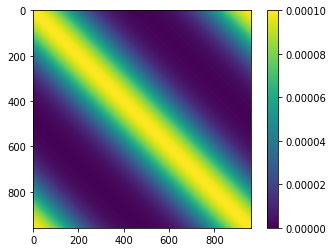

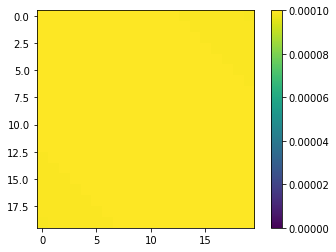

In [10]:
imshow(R_small, vmin=0)
imshow(R_small[:20, :20], vmin=0)

In [11]:
Zpert = np.random.multivariate_normal(Zgt[:, 0], R_small, Nez).T

Xpert = utilities.window_sum_Z(Zpert, I=I, alpha=alpha, beta=beta)
Ypert = Zpert - Xpert

In [12]:
%matplotlib inline

Text(0.5, 1.0, 'Y std; tot: 0.0000')

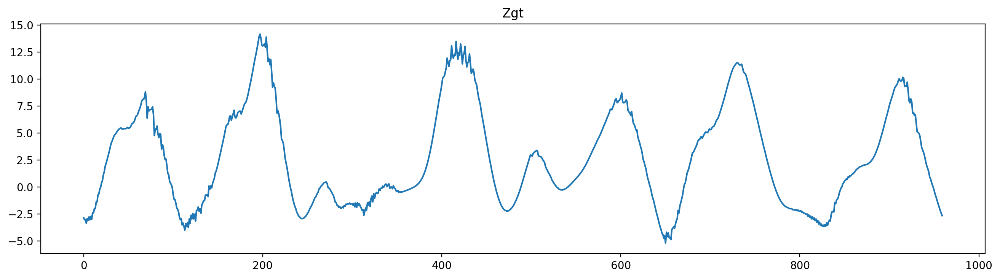

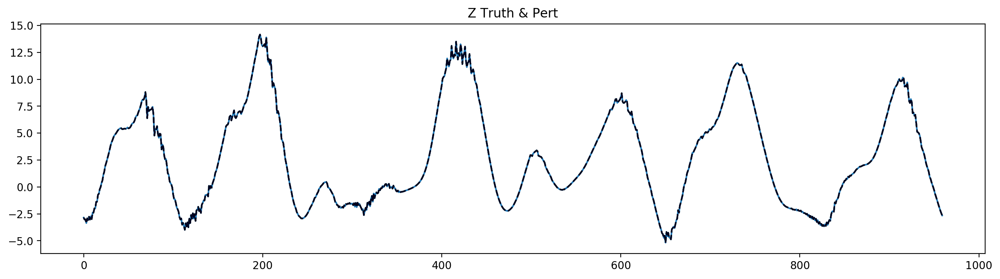

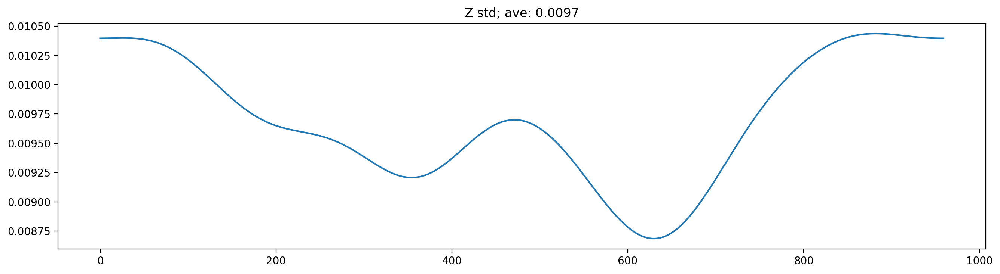

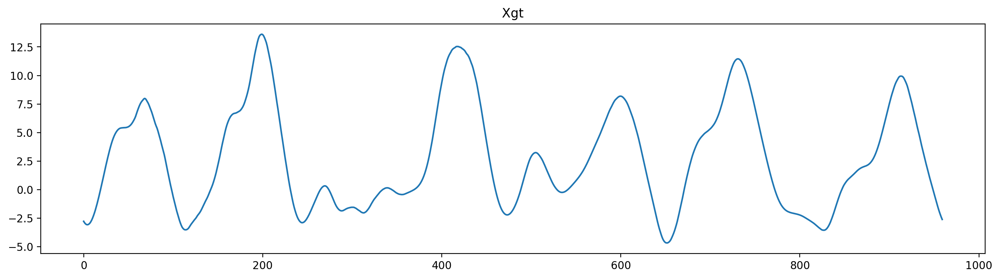

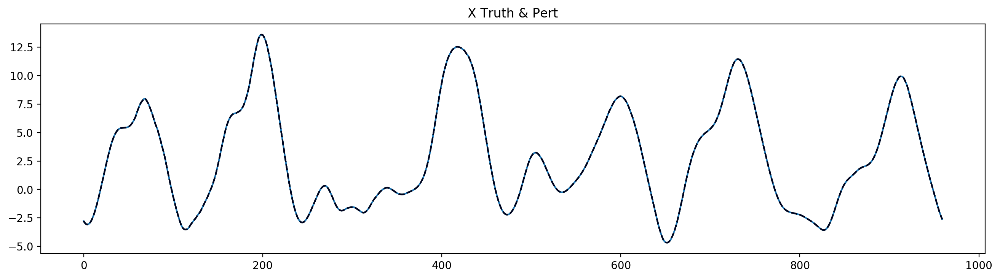

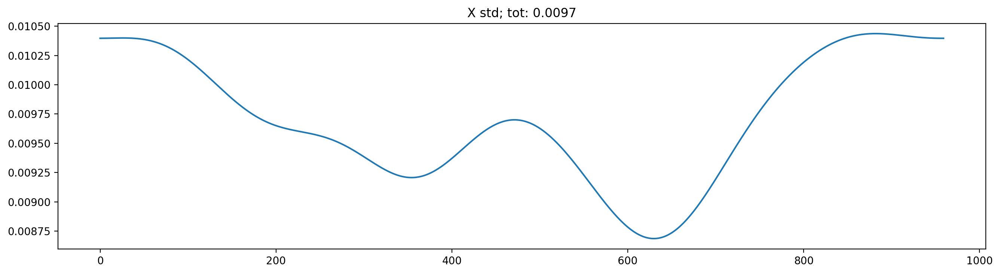

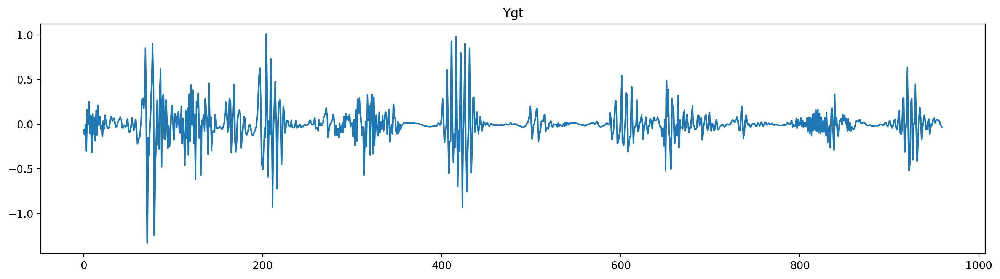

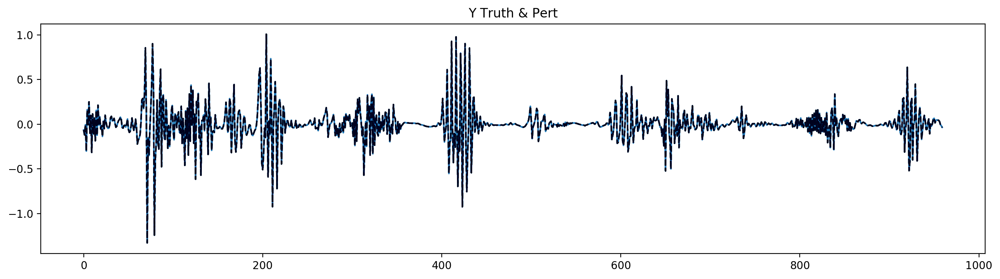

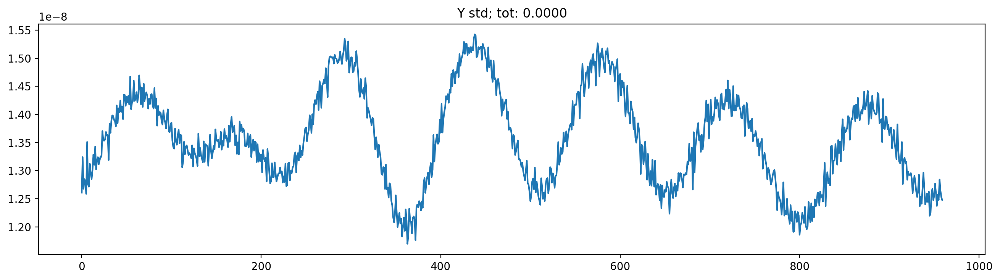

In [13]:
# Z
figsize = plt.figaspect(1/4)
plt.figure(figsize=figsize, dpi=200)
plt.plot(Zgt[:, 0])
plt.title('Zgt')

plt.figure(figsize=figsize, dpi=200)
plt.plot(Zgt[:, 0])
plt.plot(Zpert, '--k', alpha=0.01)
plt.title('Z Truth & Pert')

this_std = np.std(Zpert, axis=-1)
tot_std = this_std.mean()
plt.figure(figsize=figsize, dpi=200)
plt.plot(this_std)
plt.title('Z std')
plt.title(f'Z std; ave: {tot_std:0.4f}')


# X
figsize = plt.figaspect(1/4)
plt.figure(figsize=figsize, dpi=200)
plt.plot(Xgt[:, 0])
plt.title('Xgt')

plt.figure(figsize=figsize, dpi=200)
plt.plot(Xgt[:, 0])
plt.plot(Xpert, '--k', alpha=0.01)
plt.title('X Truth & Pert')

this_std = np.std(Xpert, axis=-1)
tot_std = this_std.mean()
plt.figure(figsize=figsize, dpi=200)
plt.plot(this_std)
plt.title(f'X std; tot: {tot_std:0.4f}')

# Y
figsize = plt.figaspect(1/4)
plt.figure(figsize=figsize, dpi=200)
plt.plot(Ygt[:, 0])
plt.title('Ygt')

plt.figure(figsize=figsize, dpi=200)
plt.plot(Ygt[:, 0])
plt.plot(Ypert, '--k', alpha=0.01)
plt.title('Y Truth & Pert')

this_std = np.std(Ypert, axis=-1)
tot_std = this_std.mean()
plt.figure(figsize=figsize, dpi=200)
plt.plot(this_std)
plt.title(f'Y std; tot: {tot_std:0.4f}')

In [14]:
Zpert_ts = utilities.return_LM3_ens_data(Zpert, dt=dt_gt, T=Tmax, dt_obs=dt_gt)

Return all


In [15]:
Xpert_ts = Zpert_ts * np.nan
for count in range(Zpert_ts.shape[-1]):
    Xpert_ts[:, :, count] = utilities.window_sum_Z(
        Zpert_ts[:, :, count], I=I, alpha=alpha, beta=beta)
Ypert_ts = Zpert_ts - Xpert_ts

In [16]:
# every = int(dt_small/dt_gt)
# plot_num = int(dt_mid/dt_small)
# for ii, t in enumerate(t_gt[::every]):
#     iie = every * ii
# #     # Z
# # #     figsize = plt.figaspect(1/4)
# # #     plt.figure(figsize=figsize, dpi=200)
# # #     plt.plot(Zgt[:, iie])
# # #     plt.title(f'Zgt; Time: {t:0.4f}')

#     plt.figure(figsize=figsize, dpi=200)
#     plt.plot(Zgt[:, iie])
#     plt.plot(Zpert_ts[:, :, iie], '--k', alpha=0.01)
#     plt.title(f'Z Truth & Pert; Time: {t:0.4f}')

#     this_std = np.std(Zpert_ts[:, :, iie], axis=-1)
#     tot_std = this_std.mean()
#     plt.figure(figsize=figsize, dpi=200)
#     plt.plot(this_std)
#     plt.title('Z std')
#     plt.title(f'Z std; ave: {tot_std:0.4f}; Time: {t:0.4f}')


#     # X
# #     figsize = plt.figaspect(1/4)
# #     plt.figure(figsize=figsize, dpi=200)
# #     plt.plot(Xgt[:, iie])
# #     plt.title(f'Xgt; Time: {t:0.4f}')

#     plt.figure(figsize=figsize, dpi=200)
#     plt.plot(Xgt[:, iie])
#     plt.plot(Xpert_ts[:, :, iie], '--k', alpha=0.01)
#     plt.title(f'X Truth & Pert; Time: {t:0.4f}')

#     this_std = np.std(Xpert_ts[:, :, iie], axis=-1)
#     tot_std = this_std.mean()
#     plt.figure(figsize=figsize, dpi=200)
#     plt.plot(this_std)
#     plt.title(f'X std; tot: {tot_std:0.4f}; Time: {t:0.4f}')

#     # Y
# #     figsize = plt.figaspect(1/4)
# #     plt.figure(figsize=figsize, dpi=200)
# #     plt.plot(Ygt[:, iie])
# #     plt.title(f'Ygt; Time: {t:0.4f}')

#     plt.figure(figsize=figsize, dpi=200)
#     plt.plot(Ygt[:, iie])
#     plt.plot(Ypert_ts[:, :, iie], '--k', alpha=0.01)
#     plt.title(f'Y Truth & Pert; Time: {t:0.4f}')

#     this_std = np.std(Ypert_ts[:, :, iie], axis=-1)
#     tot_std = this_std.mean()
#     plt.figure(figsize=figsize, dpi=200)
#     plt.plot(this_std)
#     plt.title(f'Y std; tot: {tot_std:0.4f}; Time: {t:0.4f}')
#     if ii >= plot_num:
#         break

In [17]:
# every = int(dt_mid/dt_gt)
# plot_num = int(dt_large/dt_mid)
# for ii, t in enumerate(t_gt[::every]):
#     iie = every * ii
# #     # Z
# # #     figsize = plt.figaspect(1/4)
# # #     plt.figure(figsize=figsize, dpi=200)
# # #     plt.plot(Zgt[:, iie])
# # #     plt.title(f'Zgt; Time: {t:0.4f}')

#     plt.figure(figsize=figsize, dpi=200)
#     plt.plot(Zgt[:, iie])
#     plt.plot(Zpert_ts[:, :, iie], '--k', alpha=0.01)
#     plt.title(f'Z Truth & Pert; Time: {t:0.4f}')

#     this_std = np.std(Zpert_ts[:, :, iie], axis=-1)
#     tot_std = this_std.mean()
#     plt.figure(figsize=figsize, dpi=200)
#     plt.plot(this_std)
#     plt.title('Z std')
#     plt.title(f'Z std; ave: {tot_std:0.4f}; Time: {t:0.4f}')


#     # X
# #     figsize = plt.figaspect(1/4)
# #     plt.figure(figsize=figsize, dpi=200)
# #     plt.plot(Xgt[:, iie])
# #     plt.title(f'Xgt; Time: {t:0.4f}')

#     plt.figure(figsize=figsize, dpi=200)
#     plt.plot(Xgt[:, iie])
#     plt.plot(Xpert_ts[:, :, iie], '--k', alpha=0.01)
#     plt.title(f'X Truth & Pert; Time: {t:0.4f}')

#     this_std = np.std(Xpert_ts[:, :, iie], axis=-1)
#     tot_std = this_std.mean()
#     plt.figure(figsize=figsize, dpi=200)
#     plt.plot(this_std)
#     plt.title(f'X std; tot: {tot_std:0.4f}; Time: {t:0.4f}')

#     # Y
# #     figsize = plt.figaspect(1/4)
# #     plt.figure(figsize=figsize, dpi=200)
# #     plt.plot(Ygt[:, iie])
# #     plt.title(f'Ygt; Time: {t:0.4f}')

#     plt.figure(figsize=figsize, dpi=200)
#     plt.plot(Ygt[:, iie])
#     plt.plot(Ypert_ts[:, :, iie], '--k', alpha=0.01)
#     plt.title(f'Y Truth & Pert; Time: {t:0.4f}')

#     this_std = np.std(Ypert_ts[:, :, iie], axis=-1)
#     tot_std = this_std.mean()
#     plt.figure(figsize=figsize, dpi=200)
#     plt.plot(this_std)
#     plt.title(f'Y std; tot: {tot_std:0.4f}; Time: {t:0.4f}')
#     if ii >= plot_num:
#         break

In [18]:
Zstd = np.ones([Nz, t_gt.size]) * np.nan
Xstd = Zstd.copy()
Ystd = Zstd.copy()
for count in range(Zpert_ts.shape[-1]):
    Zstd[:, count] = np.std(
        Zpert_ts[:, :, count], axis=-1)
    Xstd[:, count] = np.std(
        Xpert_ts[:, :, count], axis=-1)
    Ystd[:, count] = np.std(
        Ypert_ts[:, :, count], axis=-1)

In [19]:
# this_path = os.path.join(save_dir, 'Zpert_ts_c.npy')
# Zpert_ts = np.load(this_path)

# this_path = os.path.join(save_dir, 'Xpert_ts_c.npy')
# Xpert_ts = np.load(this_path)

# this_path = os.path.join(save_dir, 'Ypert_ts_c.npy')
# Ypert_ts = np.load(this_path)

# this_path = os.path.join(save_dir, 'Zstd_c.npy')
# Zstd = np.load(this_path)

# this_path = os.path.join(save_dir, 'Xstd_c.npy')
# Xstd = np.load(this_path)

# this_path = os.path.join(save_dir, 'Ystd_c.npy')
# Ystd = np.load(this_path)

In [20]:
Zstd_ave = Zstd.mean(axis=0)
Xstd_ave = Xstd.mean(axis=0)
Ystd_ave = Ystd.mean(axis=0)

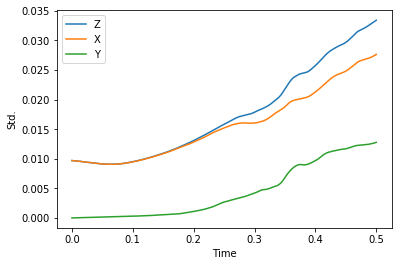

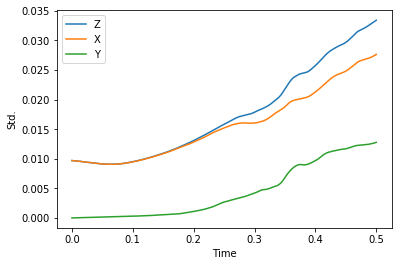

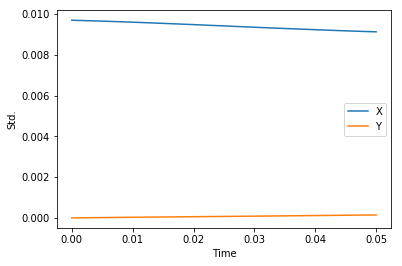

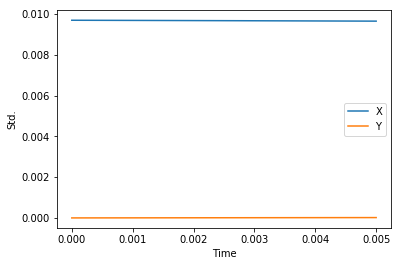

In [21]:
plt.figure()
plt.plot(t_gt, Zstd_ave)
plt.plot(t_gt, Xstd_ave)
plt.plot(t_gt, Ystd_ave)
plt.ylabel('Std.')
plt.xlabel('Time')
plt.legend(['Z', 'X', 'Y'])


this_index = int(dt_large/dt_gt) + 1
plt.figure()
plt.plot(t_gt[:this_index], Zstd_ave[:this_index])
plt.plot(t_gt[:this_index], Xstd_ave[:this_index])
plt.plot(t_gt[:this_index], Ystd_ave[:this_index])
plt.ylabel('Std.')
plt.xlabel('Time')
plt.legend(['Z', 'X', 'Y'])
             
this_index = int(dt_mid/dt_gt) + 1
plt.figure()
# plt.plot(t_gt[:this_index],   Zstd_ave[:this_index])
plt.plot(t_gt[:this_index], Xstd_ave[:this_index])
plt.plot(t_gt[:this_index], Ystd_ave[:this_index])
plt.ylabel('Std.')
plt.xlabel('Time')
plt.legend(['X', 'Y'])

this_index = int(dt_small/dt_gt) + 1
plt.figure()
# plt.plot(t_gt[:this_index], Zstd_ave[:this_index])
plt.plot(t_gt[:this_index], Xstd_ave[:this_index])
plt.plot(t_gt[:this_index], Ystd_ave[:this_index])
plt.ylabel('Std.')
plt.xlabel('Time')
plt.legend(['X', 'Y'])

In [22]:
%matplotlib inline

/Users/harty/miniconda3/envs/loc/lib/python3.7/site-packages/matplotlib/pyplot.py:514: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)


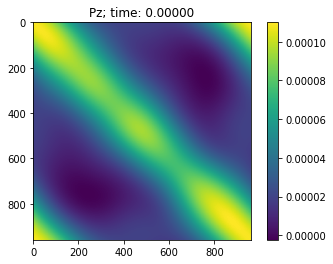

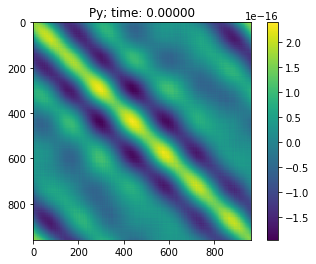

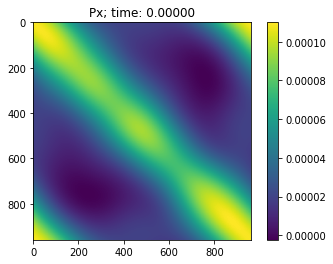

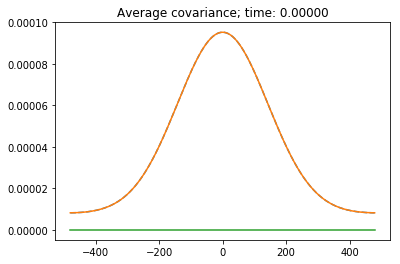

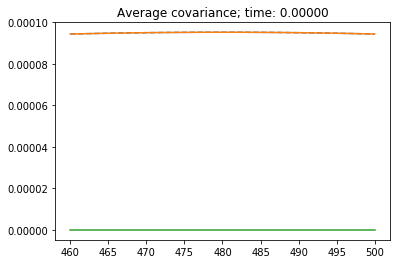

...

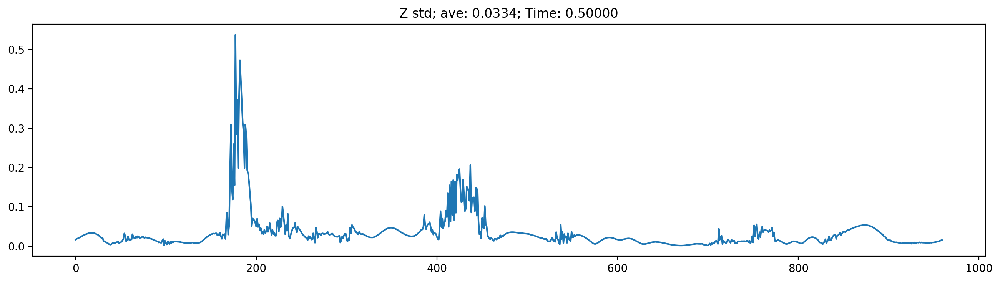

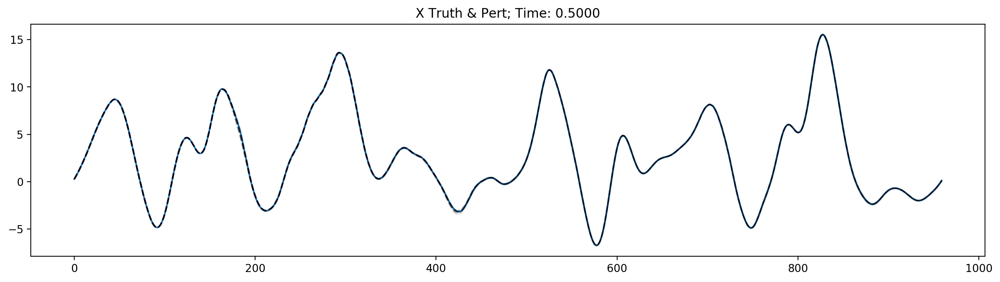

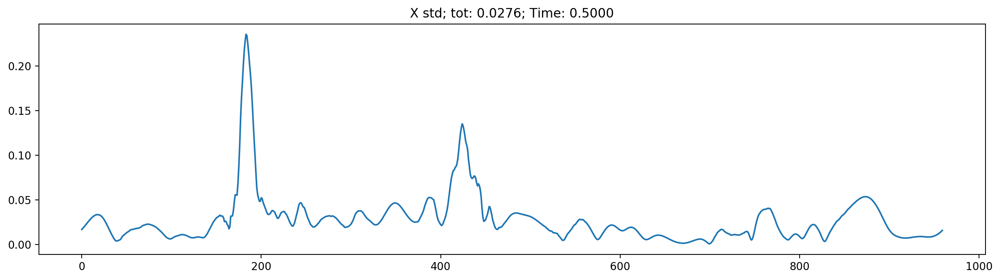

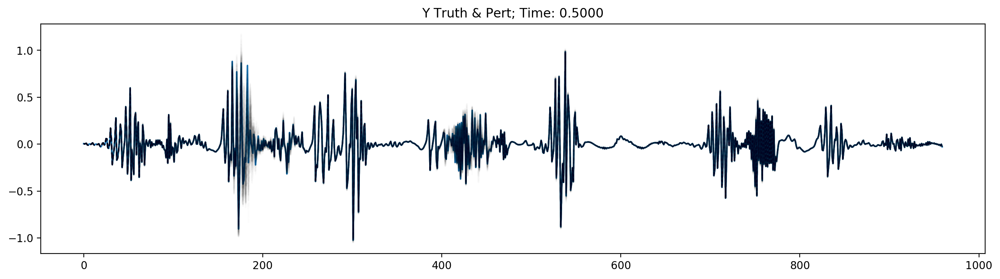

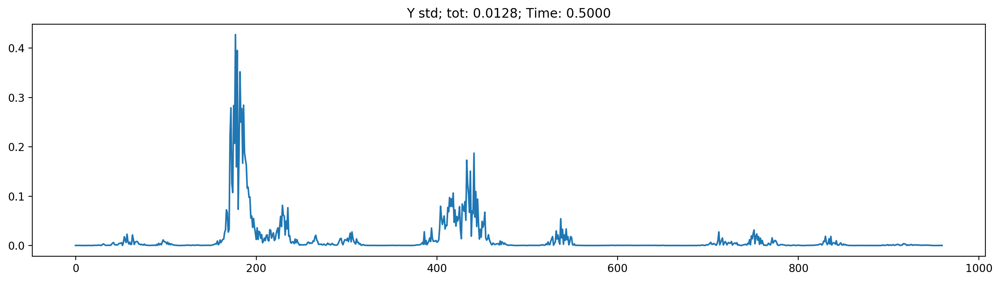

In [23]:
time_range = [0, dt_small, dt_mid, dt_large]
for this_t in time_range:
    this_index = int(this_t/dt_gt)
    this_t = t_gt[this_index]
    this_Pz = np.cov(Zpert_ts[:, :, this_index])
    imshow(this_Pz,
           title=f'Pz; time: {this_t:0.5f}')
    this_Py = np.cov(Ypert_ts[:, :, this_index])
    imshow(this_Py,
           title=f'Py; time: {this_t:0.5f}')
    this_Px = np.cov(Xpert_ts[:, :, this_index])
    imshow(this_Px,
           title=f'Px; time: {this_t:0.5f}')
    
    center = Nz//2
    roll_Pz = this_Pz * np.nan
    roll_Px = this_Px * np.nan
    roll_Py = this_Py * np.nan
    for ii in range(Nz):
        this_var = np.roll(this_Pz[ii], center - ii)
        roll_Pz[ii] = this_var

        this_var = np.roll(this_Px[ii], center - ii)
        roll_Px[ii] = this_var

        this_var = np.roll(this_Py[ii], center - ii)
        roll_Py[ii] = this_var
    
    plt.figure()
    plt.plot(np.arange(-center,
                       center),
             roll_Pz.mean(axis=0), '--')
    plt.plot(np.arange(-center,
                       center),
             roll_Px.mean(axis=0))
    plt.plot(np.arange(-center,
                       center),
             roll_Py.mean(axis=0))
    plt.title(f'Average covariance; time: {this_t:0.5f}')
    
    distance = 20
    plt.figure()
    plt.plot(np.arange(center - distance,
                       center + distance + 1),
             roll_Pz.mean(axis=0)[center - distance:
                                  center + distance + 1], '--')
    plt.plot(np.arange(center - distance,
                       center + distance + 1),
             roll_Px.mean(axis=0)[center - distance:
                                  center + distance + 1])
    plt.plot(np.arange(center - distance,
                       center + distance + 1),
             roll_Py.mean(axis=0)[center - distance:
                                  center + distance + 1])
    plt.title(f'Average covariance; time: {this_t:0.5f}')
    
    
    
    plt.figure(figsize=figsize, dpi=200)
    plt.plot(Zgt[:, this_index])
    plt.plot(Zpert_ts[:, :, this_index], '--k', alpha=0.01)
    plt.title(f'Z Truth & Pert; Time: {this_t:0.5f}')

    this_std = np.std(Zpert_ts[:, :, this_index], axis=-1)
    tot_std = this_std.mean()
    plt.figure(figsize=figsize, dpi=200)
    plt.plot(this_std)
    plt.title('Z std')
    plt.title(f'Z std; ave: {tot_std:0.4f}; Time: {this_t:0.5f}')


    # X
#     figsize = plt.figaspect(1/4)
#     plt.figure(figsize=figsize, dpi=200)
#     plt.plot(Xgt[:, iie])
#     plt.title(f'Xgt; Time: {t:0.4f}')

    plt.figure(figsize=figsize, dpi=200)
    plt.plot(Xgt[:, this_index])
    plt.plot(Xpert_ts[:, :, this_index], '--k', alpha=0.01)
    plt.title(f'X Truth & Pert; Time: {this_t:0.4f}')

    this_std = np.std(Xpert_ts[:, :, this_index], axis=-1)
    tot_std = this_std.mean()
    plt.figure(figsize=figsize, dpi=200)
    plt.plot(this_std)
    plt.title(f'X std; tot: {tot_std:0.4f}; Time: {this_t:0.4f}')

    # Y
#     figsize = plt.figaspect(1/4)
#     plt.figure(figsize=figsize, dpi=200)
#     plt.plot(Ygt[:, iie])
#     plt.title(f'Ygt; Time: {t:0.4f}')

    plt.figure(figsize=figsize, dpi=200)
    plt.plot(Ygt[:, this_index])
    plt.plot(Ypert_ts[:, :, this_index], '--k', alpha=0.01)
    plt.title(f'Y Truth & Pert; Time: {this_t:0.4f}')

    this_std = np.std(Ypert_ts[:, :, this_index], axis=-1)
    tot_std = this_std.mean()
    plt.figure(figsize=figsize, dpi=200)
    plt.plot(this_std)
    plt.title(f'Y std; tot: {tot_std:0.4f}; Time: {this_t:0.4f}')

Text(0.5, 1.0, 'Y std; tot: 0.0001; Time: 0.0500')

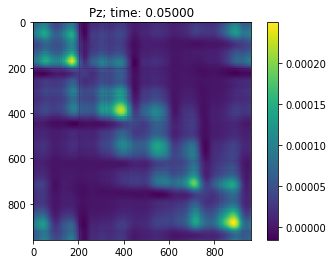

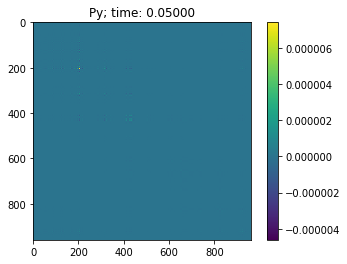

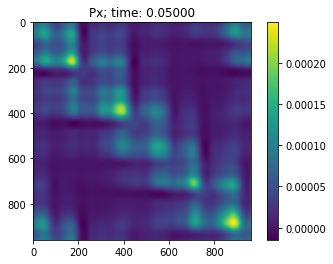

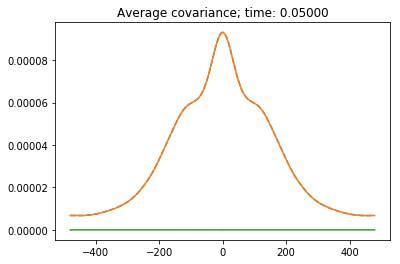

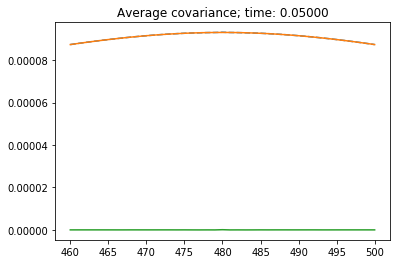

...

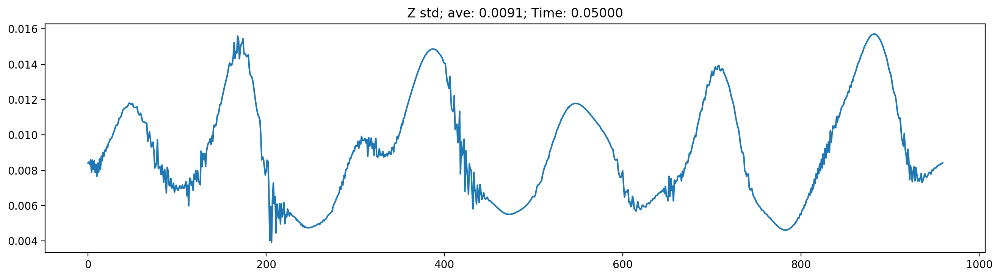

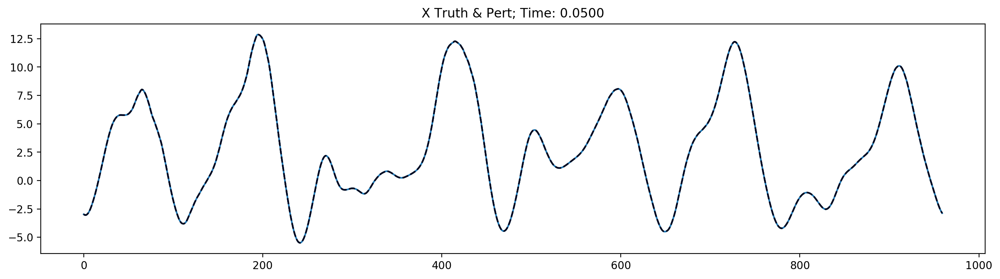

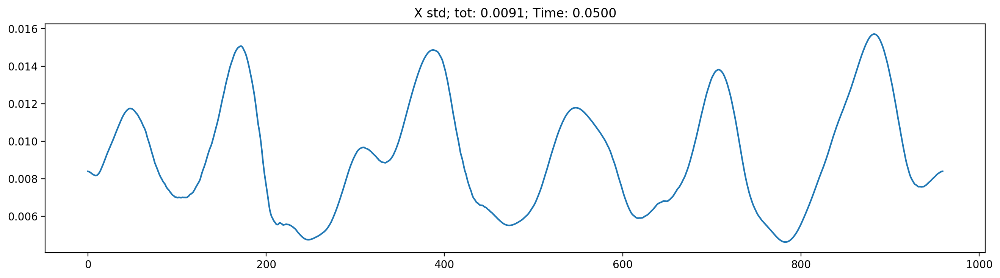

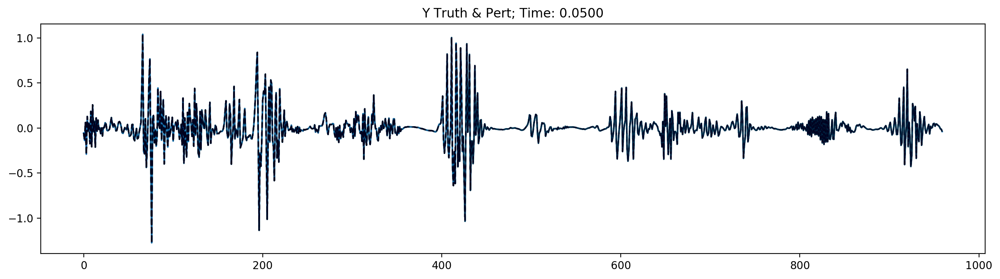

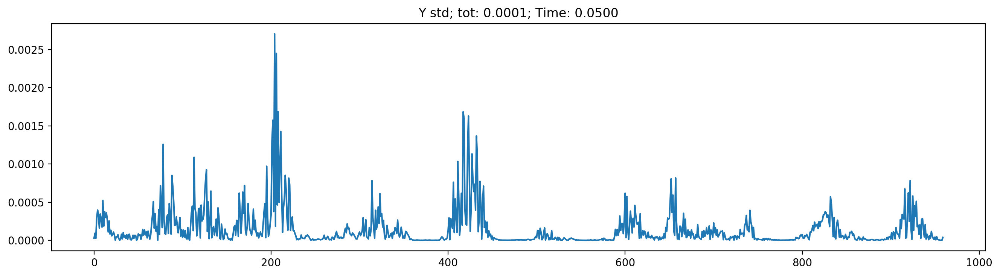

In [24]:

this_t = dt_mid
this_index = int(this_t/dt_gt)
this_t = t_gt[this_index]
this_Pz = np.cov(Zpert_ts[:, :, this_index])
imshow(this_Pz,
       title=f'Pz; time: {this_t:0.5f}')
this_Py = np.cov(Ypert_ts[:, :, this_index])
imshow(this_Py,
       title=f'Py; time: {this_t:0.5f}')
this_Px = np.cov(Xpert_ts[:, :, this_index])
imshow(this_Px,
       title=f'Px; time: {this_t:0.5f}')

center = Nz//2
roll_Pz = this_Pz * np.nan
roll_Px = this_Px * np.nan
roll_Py = this_Py * np.nan
for ii in range(Nz):
    this_var = np.roll(this_Pz[ii], center - ii)
    roll_Pz[ii] = this_var

    this_var = np.roll(this_Px[ii], center - ii)
    roll_Px[ii] = this_var

    this_var = np.roll(this_Py[ii], center - ii)
    roll_Py[ii] = this_var

plt.figure()
plt.plot(np.arange(-center,
                   center),
         roll_Pz.mean(axis=0), '--')
plt.plot(np.arange(-center,
                   center),
         roll_Px.mean(axis=0))
plt.plot(np.arange(-center,
                   center),
         roll_Py.mean(axis=0))
plt.title(f'Average covariance; time: {this_t:0.5f}')

distance = 20
plt.figure()
plt.plot(np.arange(center - distance,
                   center + distance + 1),
         roll_Pz.mean(axis=0)[center - distance:
                              center + distance + 1], '--')
plt.plot(np.arange(center - distance,
                   center + distance + 1),
         roll_Px.mean(axis=0)[center - distance:
                              center + distance + 1])
plt.plot(np.arange(center - distance,
                   center + distance + 1),
         roll_Py.mean(axis=0)[center - distance:
                              center + distance + 1])
plt.title(f'Average covariance; time: {this_t:0.5f}')



plt.figure(figsize=figsize, dpi=200)
plt.plot(Zgt[:, this_index])
plt.plot(Zpert_ts[:, :, this_index], '--k', alpha=0.01)
plt.title(f'Z Truth & Pert; Time: {this_t:0.5f}')

this_std = np.std(Zpert_ts[:, :, this_index], axis=-1)
tot_std = this_std.mean()
plt.figure(figsize=figsize, dpi=200)
plt.plot(this_std)
plt.title('Z std')
plt.title(f'Z std; ave: {tot_std:0.4f}; Time: {this_t:0.5f}')


# X
#     figsize = plt.figaspect(1/4)
#     plt.figure(figsize=figsize, dpi=200)
#     plt.plot(Xgt[:, iie])
#     plt.title(f'Xgt; Time: {t:0.4f}')

plt.figure(figsize=figsize, dpi=200)
plt.plot(Xgt[:, this_index])
plt.plot(Xpert_ts[:, :, this_index], '--k', alpha=0.01)
plt.title(f'X Truth & Pert; Time: {this_t:0.4f}')

this_std = np.std(Xpert_ts[:, :, this_index], axis=-1)
tot_std = this_std.mean()
plt.figure(figsize=figsize, dpi=200)
plt.plot(this_std)
plt.title(f'X std; tot: {tot_std:0.4f}; Time: {this_t:0.4f}')

# Y
#     figsize = plt.figaspect(1/4)
#     plt.figure(figsize=figsize, dpi=200)
#     plt.plot(Ygt[:, iie])
#     plt.title(f'Ygt; Time: {t:0.4f}')

plt.figure(figsize=figsize, dpi=200)
plt.plot(Ygt[:, this_index])
plt.plot(Ypert_ts[:, :, this_index], '--k', alpha=0.01)
plt.title(f'Y Truth & Pert; Time: {this_t:0.4f}')

this_std = np.std(Ypert_ts[:, :, this_index], axis=-1)
tot_std = this_std.mean()
plt.figure(figsize=figsize, dpi=200)
plt.plot(this_std)
plt.title(f'Y std; tot: {tot_std:0.4f}; Time: {this_t:0.4f}')

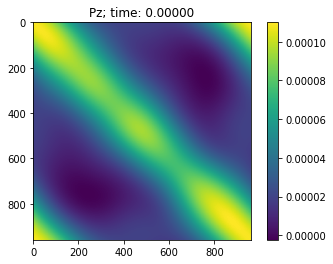

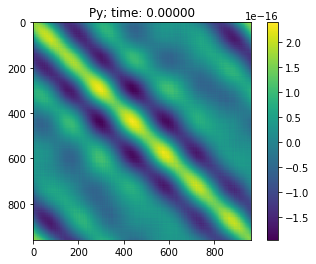

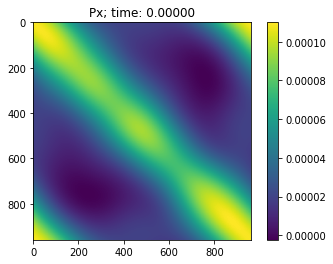

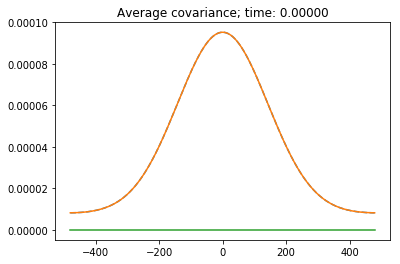

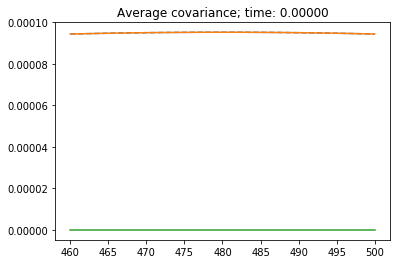

...

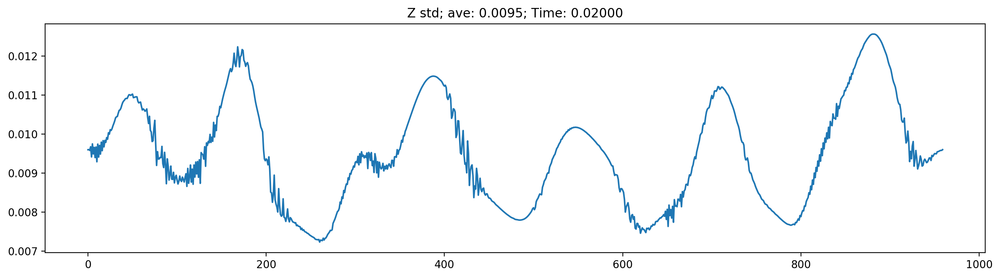

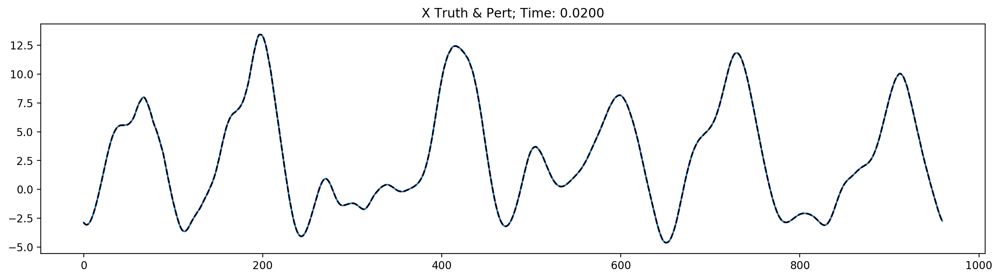

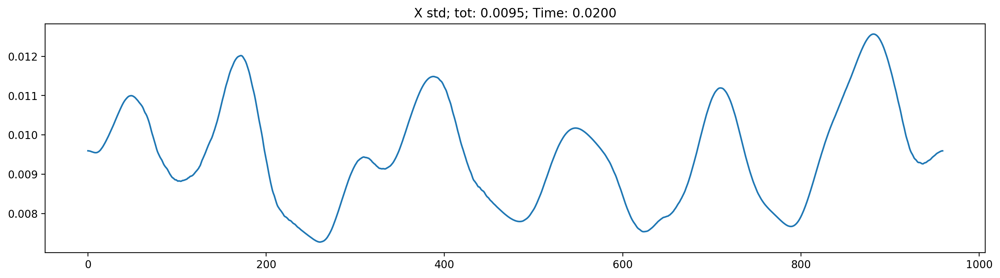

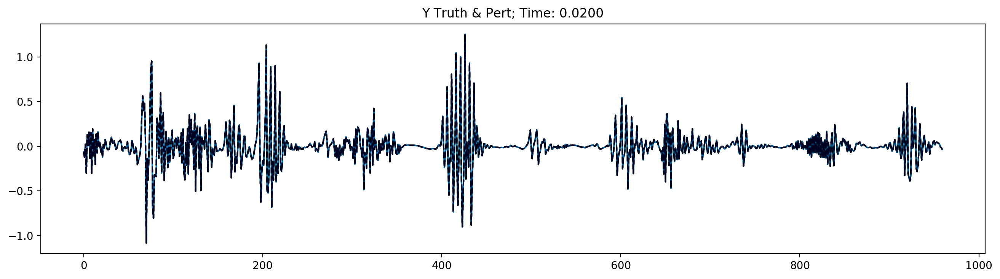

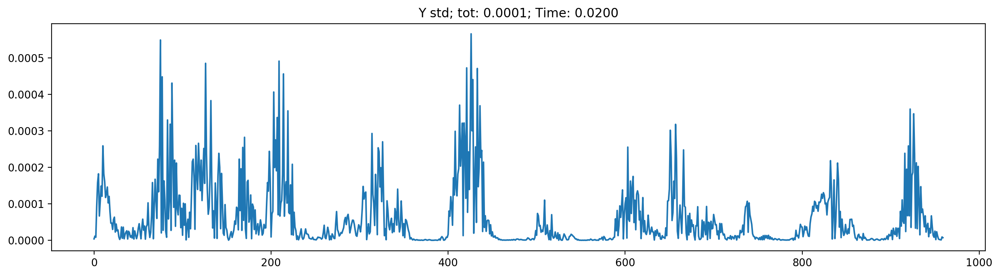

In [25]:
time_range = [0, dt_small, 2*dt_small, 3*dt_small, 4*dt_small]
for this_t in time_range:
    this_index = int(this_t/dt_gt)
    this_t = t_gt[this_index]
    this_Pz = np.cov(Zpert_ts[:, :, this_index])
    imshow(this_Pz,
           title=f'Pz; time: {this_t:0.5f}')
    this_Py = np.cov(Ypert_ts[:, :, this_index])
    imshow(this_Py,
           title=f'Py; time: {this_t:0.5f}')
    this_Px = np.cov(Xpert_ts[:, :, this_index])
    imshow(this_Px,
           title=f'Px; time: {this_t:0.5f}')
    
    center = Nz//2
    roll_Pz = this_Pz * np.nan
    roll_Px = this_Px * np.nan
    roll_Py = this_Py * np.nan
    for ii in range(Nz):
        this_var = np.roll(this_Pz[ii], center - ii)
        roll_Pz[ii] = this_var

        this_var = np.roll(this_Px[ii], center - ii)
        roll_Px[ii] = this_var

        this_var = np.roll(this_Py[ii], center - ii)
        roll_Py[ii] = this_var
    
    plt.figure()
    plt.plot(np.arange(-center,
                       center),
             roll_Pz.mean(axis=0), '--')
    plt.plot(np.arange(-center,
                       center),
             roll_Px.mean(axis=0))
    plt.plot(np.arange(-center,
                       center),
             roll_Py.mean(axis=0))
    plt.title(f'Average covariance; time: {this_t:0.5f}')
    
    distance = 20
    plt.figure()
    plt.plot(np.arange(center - distance,
                       center + distance + 1),
             roll_Pz.mean(axis=0)[center - distance:
                                  center + distance + 1], '--')
    plt.plot(np.arange(center - distance,
                       center + distance + 1),
             roll_Px.mean(axis=0)[center - distance:
                                  center + distance + 1])
    plt.plot(np.arange(center - distance,
                       center + distance + 1),
             roll_Py.mean(axis=0)[center - distance:
                                  center + distance + 1])
    plt.title(f'Average covariance; time: {this_t:0.5f}')
    
    
    
    plt.figure(figsize=figsize, dpi=200)
    plt.plot(Zgt[:, this_index])
    plt.plot(Zpert_ts[:, :, this_index], '--k', alpha=0.01)
    plt.title(f'Z Truth & Pert; Time: {this_t:0.5f}')

    this_std = np.std(Zpert_ts[:, :, this_index], axis=-1)
    tot_std = this_std.mean()
    plt.figure(figsize=figsize, dpi=200)
    plt.plot(this_std)
    plt.title('Z std')
    plt.title(f'Z std; ave: {tot_std:0.4f}; Time: {this_t:0.5f}')


    # X
#     figsize = plt.figaspect(1/4)
#     plt.figure(figsize=figsize, dpi=200)
#     plt.plot(Xgt[:, iie])
#     plt.title(f'Xgt; Time: {t:0.4f}')

    plt.figure(figsize=figsize, dpi=200)
    plt.plot(Xgt[:, this_index])
    plt.plot(Xpert_ts[:, :, this_index], '--k', alpha=0.01)
    plt.title(f'X Truth & Pert; Time: {this_t:0.4f}')

    this_std = np.std(Xpert_ts[:, :, this_index], axis=-1)
    tot_std = this_std.mean()
    plt.figure(figsize=figsize, dpi=200)
    plt.plot(this_std)
    plt.title(f'X std; tot: {tot_std:0.4f}; Time: {this_t:0.4f}')

    # Y
#     figsize = plt.figaspect(1/4)
#     plt.figure(figsize=figsize, dpi=200)
#     plt.plot(Ygt[:, iie])
#     plt.title(f'Ygt; Time: {t:0.4f}')

    plt.figure(figsize=figsize, dpi=200)
    plt.plot(Ygt[:, this_index])
    plt.plot(Ypert_ts[:, :, this_index], '--k', alpha=0.01)
    plt.title(f'Y Truth & Pert; Time: {this_t:0.4f}')

    this_std = np.std(Ypert_ts[:, :, this_index], axis=-1)
    tot_std = this_std.mean()
    plt.figure(figsize=figsize, dpi=200)
    plt.plot(this_std)
    plt.title(f'Y std; tot: {tot_std:0.4f}; Time: {this_t:0.4f}')

In [26]:
# this_path = os.path.join(save_dir, 'Zpert_ts_c.npy')
# np.save(this_path, Zpert_ts)

# this_path = os.path.join(save_dir, 'Xpert_ts_c.npy')
# np.save(this_path, Xpert_ts)

# this_path = os.path.join(save_dir, 'Ypert_ts_c.npy')
# np.save(this_path, Ypert_ts)

# this_path = os.path.join(save_dir, 'Zstd_c.npy')
# np.save(this_path, Zstd)

# this_path = os.path.join(save_dir, 'Xstd_c.npy')
# np.save(this_path, Xstd)

# this_path = os.path.join(save_dir, 'Ystd_c.npy')
# np.save(this_path, Ystd)

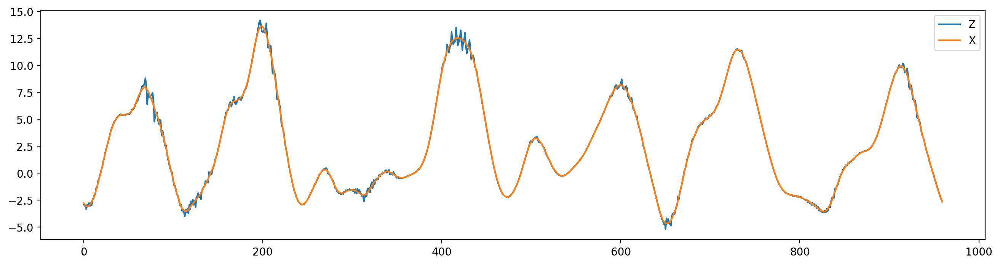

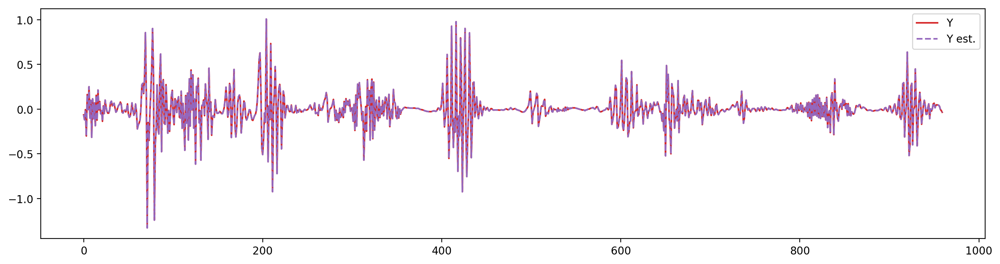

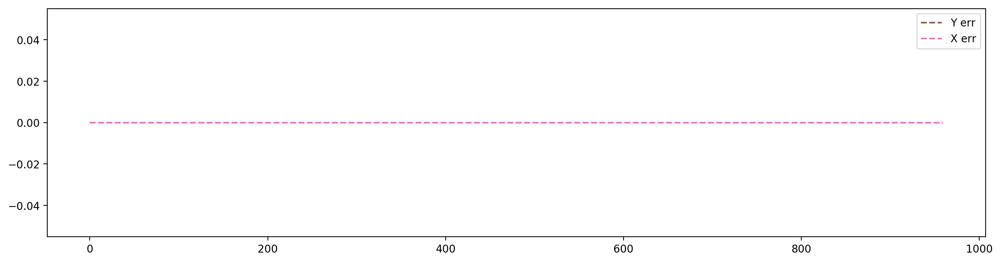

In [28]:
plt.figure(figsize=figsize, dpi=200)
plt.plot(Z1)
plt.plot(X1)
plt.legend(['Z', 'X'])

plt.figure(figsize=figsize, dpi=200)
plt.plot(Y1, color='C3')
plt.plot(Z1 - X1, color='C4', linestyle='--')
plt.legend(['Y', 'Y est.'])

plt.figure(figsize=figsize, dpi=200)
plt.plot(Y1 - (Z1 - X1), color='C5', linestyle='--')
plt.plot(X1 - X1, color='C6', linestyle='--')
plt.legend(['Y err', 'X err'])

In [29]:
ds = 0.05
smooth_range = np.arange(1, 3 + ds, ds)
Zsmooth = np.ones([Nz, smooth_range.size]) * np.nan
Ysmooth = Zsmooth.copy()
Xerr = Zsmooth.copy()
for count, this_smooth in enumerate(smooth_range):
    Zsmooth[:, count] = ndimage.gaussian_filter1d(
        Z1, this_smooth, mode='wrap')
    Ysmooth[:, count] = Z1 - Zsmooth[:, count]
    Xerr[:, count] = X1 - Zsmooth[:, count]
    print(this_smooth)
Xrmse = np.sqrt((Xerr**2).mean(axis=0))

1.0
1.05
1.1
1.1500000000000001
1.2000000000000002
1.2500000000000002
1.3000000000000003
1.3500000000000003
1.4000000000000004
1.4500000000000004
1.5000000000000004
1.5500000000000005
1.6000000000000005
1.6500000000000006
1.7000000000000006
1.7500000000000007
1.8000000000000007
1.8500000000000008
1.9000000000000008
1.9500000000000008
2.000000000000001
2.0500000000000007
2.100000000000001
2.1500000000000012
2.200000000000001
2.250000000000001
2.300000000000001
2.3500000000000014
2.4000000000000012
2.450000000000001
2.5000000000000013
2.5500000000000016
2.6000000000000014
2.6500000000000012
2.7000000000000015
2.7500000000000018
2.8000000000000016
2.8500000000000014
2.9000000000000017
2.950000000000002
3.0000000000000018


Min rmse: 0.04204059095662573
Optimal smoothing: 2.0500000000000007


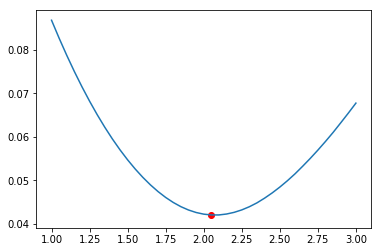

In [30]:
this_index = np.argmin(Xrmse)
print(f'Min rmse: {Xrmse[this_index]}')
print(f'Optimal smoothing: {smooth_range[this_index]}')

plt.figure()
plt.plot(smooth_range, Xrmse)
plt.scatter(smooth_range[this_index], Xrmse[this_index], color='r')

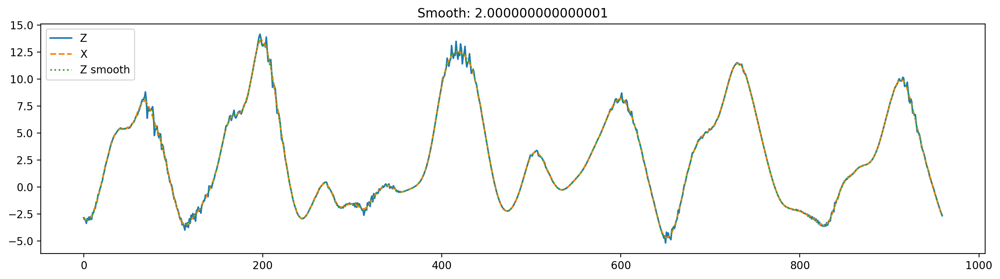

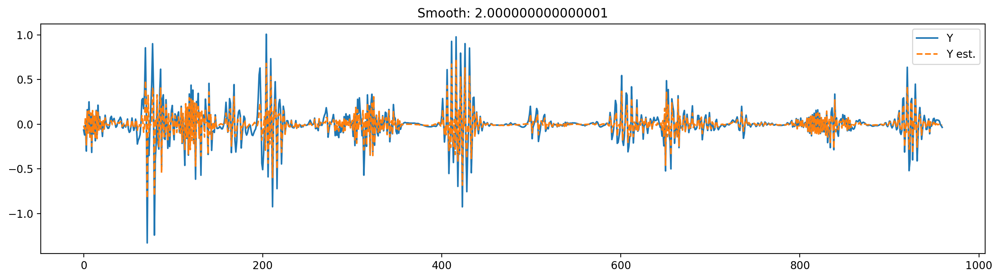

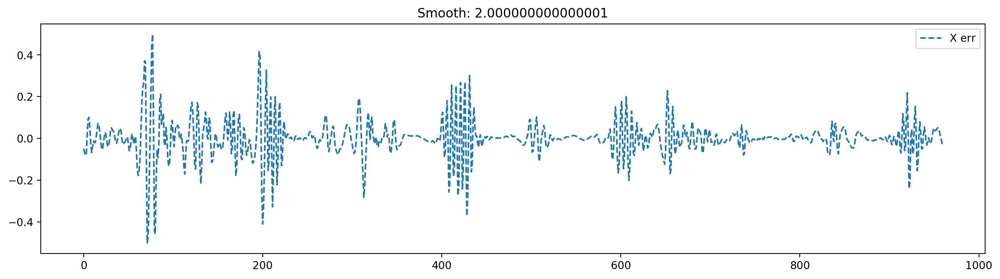

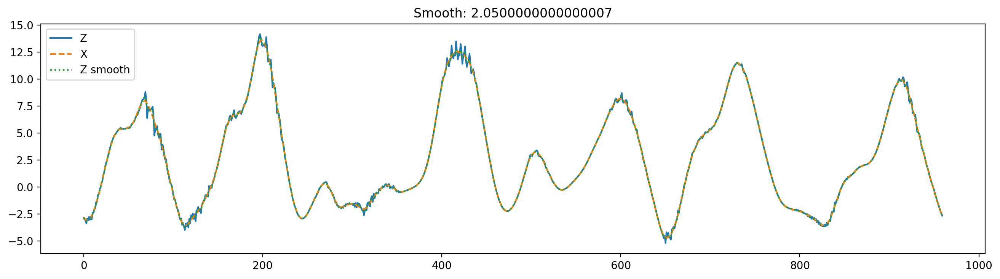

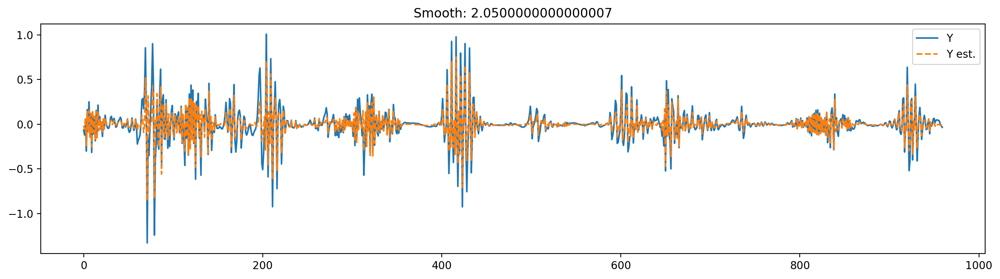

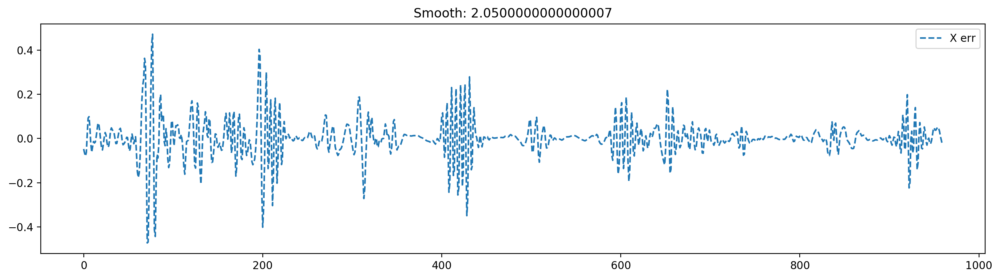

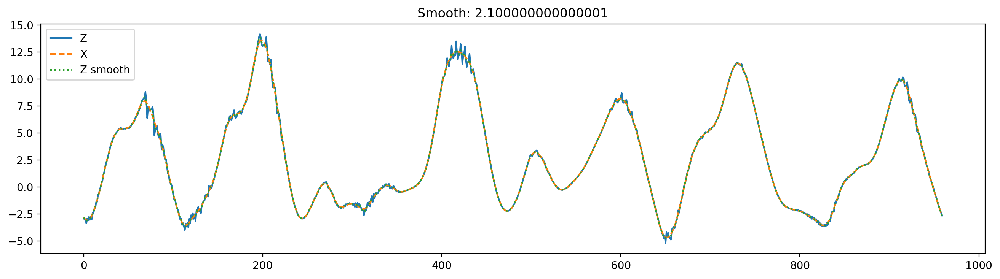

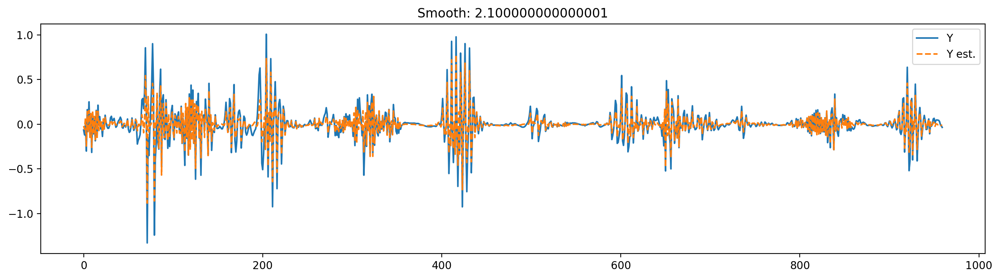

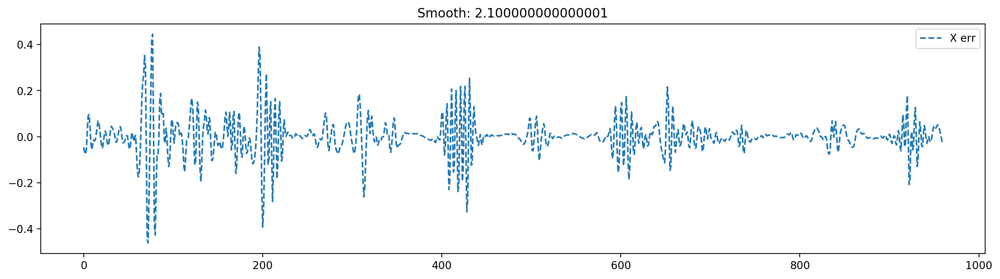

In [31]:
for count, this_smooth in enumerate(smooth_range[this_index-1:this_index + 2]):
    plt.figure(figsize=figsize, dpi=200)
    plt.plot(Z1)
    plt.plot(X1, '--')
    plt.plot(Zsmooth[:, count], ':')
    plt.legend(['Z', 'X', 'Z smooth'])
    plt.title(f'Smooth: {this_smooth}')

    plt.figure(figsize=figsize, dpi=200)
    plt.plot(Y1)
    plt.plot(Ysmooth[:, count], linestyle='--')
    plt.legend(['Y', 'Y est.'])
    plt.title(f'Smooth: {this_smooth}')

    plt.figure(figsize=figsize, dpi=200)
#     plt.plot(Ysmooth[:, count] - Y1, linestyle='--')
    plt.plot(Zsmooth[:, count] - X1, linestyle='--')
    plt.legend(['X err'])
    plt.title(f'Smooth: {this_smooth}')